# Neural Style Transfer with OpenCV

In [1]:
# import the necessary packages
import numpy as np
import time
import cv2
import os
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt 

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

### **Implement Neural Style Transfer using pretrained Models**

We use pretrained t7 PyTorch models that can be imported using ``cv2.dnn.readNetFromTouch()```

These models we're using come from the paper *Perceptual Losses for Real-Time Style Transfer and Super-Resolution* by Johnson et al. 

They improved proposing a Neural Style Transfer algorithm that performed 3 times faster by using a super-resolution-like problem based on perceptual loss function.

1. Using Model: mosaic


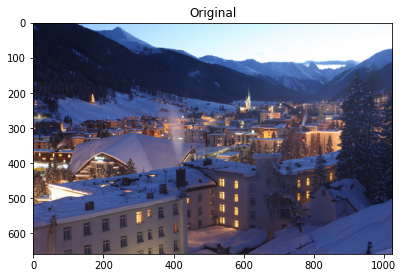

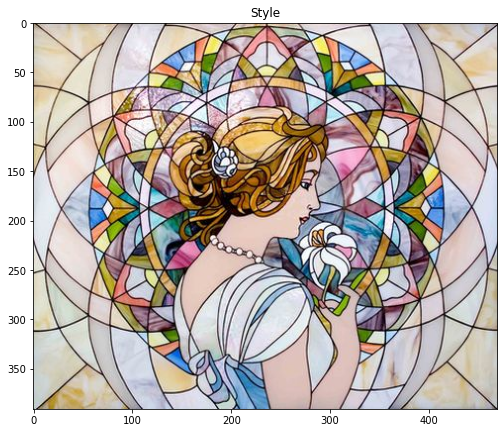

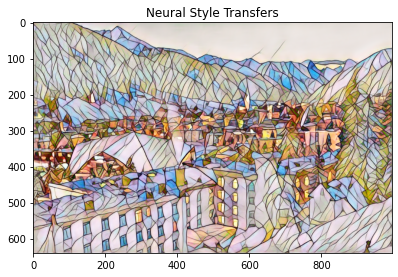

2. Using Model: feathers


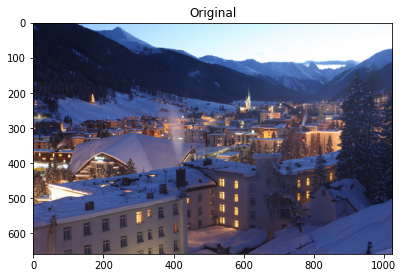

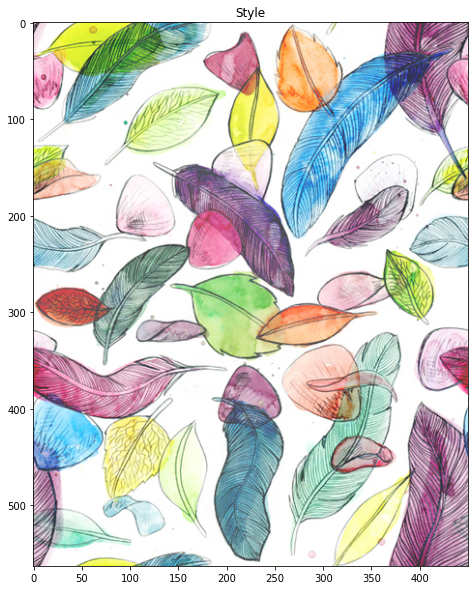

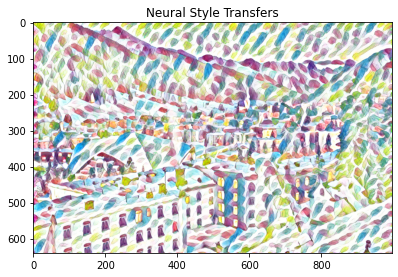

3. Using Model: the_scream


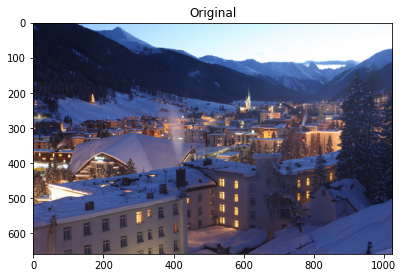

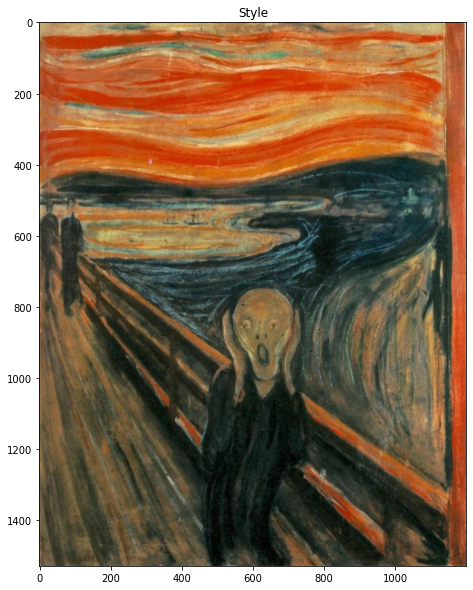

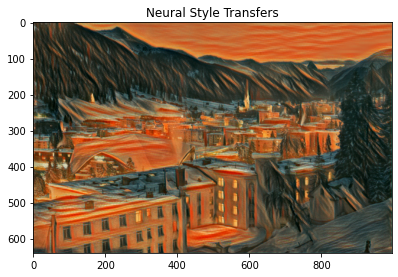

4. Using Model: udnie


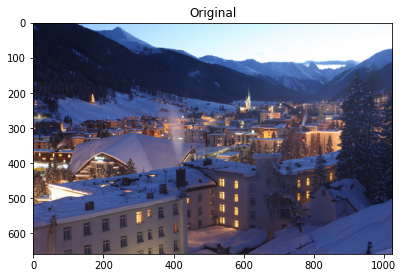

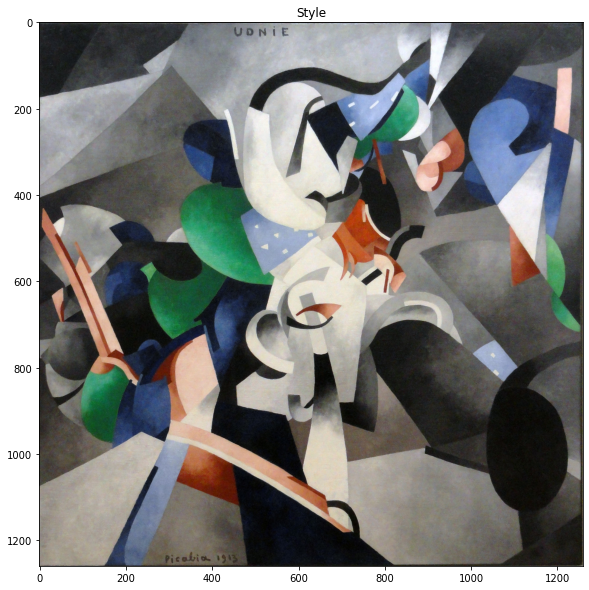

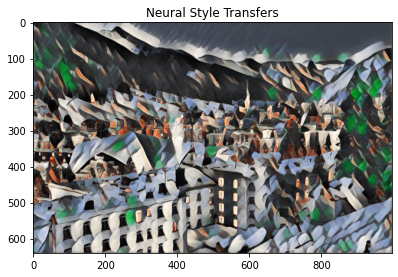

5. Using Model: la_muse


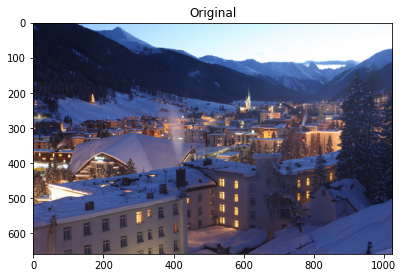

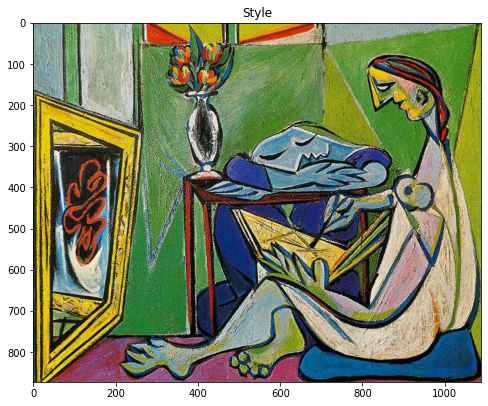

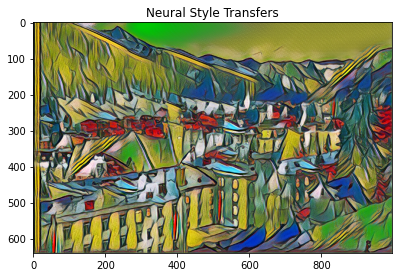

6. Using Model: composition_vii


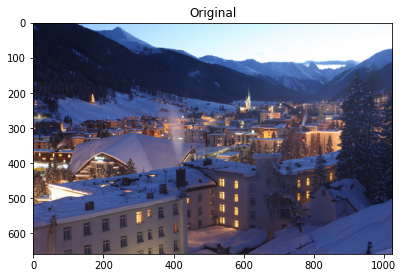

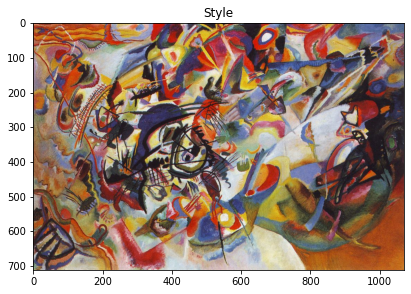

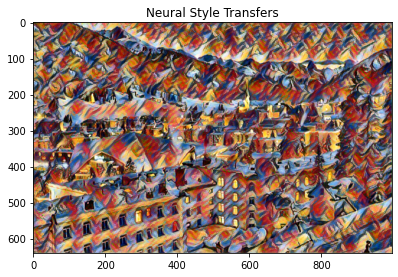

7. Using Model: candy


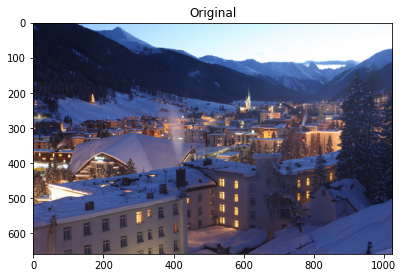

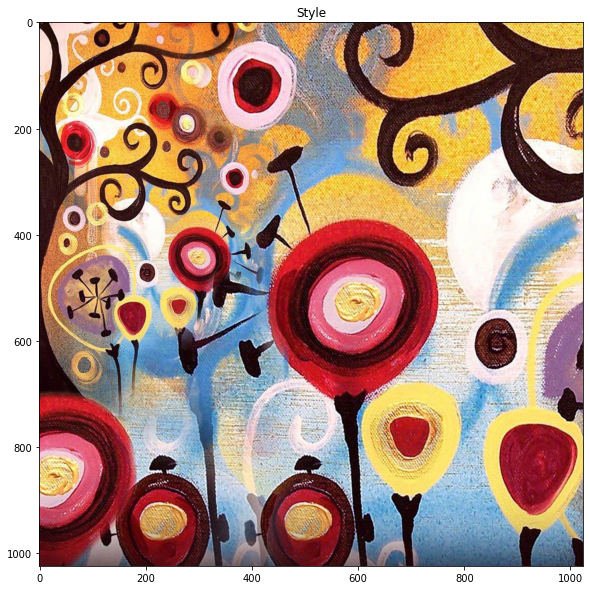

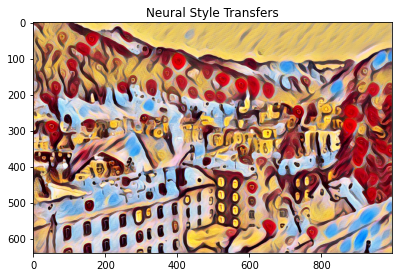

8. Using Model: starry_night


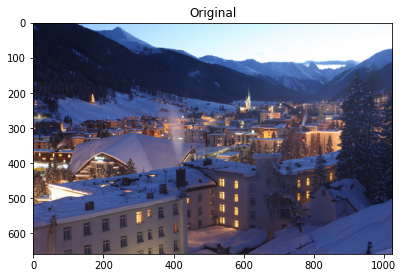

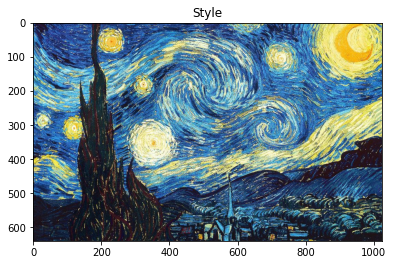

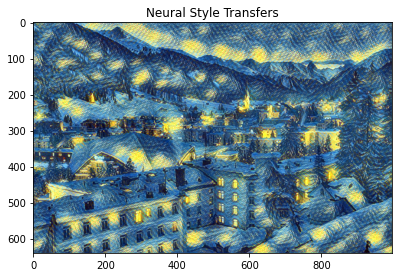

9. Using Model: the_wave


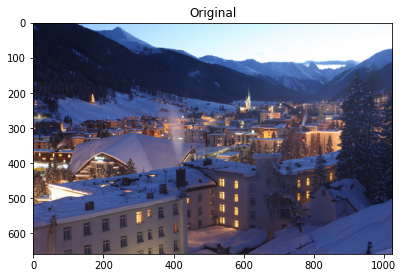

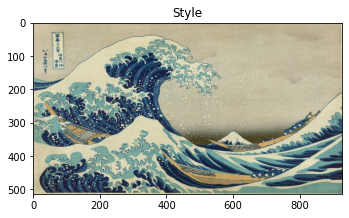

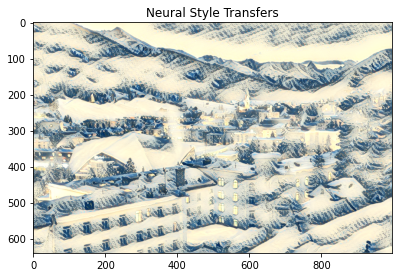

In [5]:
# Load our t7 neural transfer models
model_file_path = "NeuralStyleTransfer/models/"
model_file_paths = [f for f in listdir(model_file_path) if isfile(join(model_file_path, f))]

# Load our test image
img = cv2.imread("city.jpg")

# Loop through and applying each model style our input image
for (i,model) in enumerate(model_file_paths):
    # print the model being used
    print(str(i+1) + ". Using Model: " + str(model)[:-3])    
    style = cv2.imread("NeuralStyleTransfer/art/"+str(model)[:-3]+".jpg")
    # loading our neural style transfer model 
    neuralStyleModel = cv2.dnn.readNetFromTorch(model_file_path+ model)

    # Let's resize to a fixed height of 640 (feel free to change)
    height, width = int(img.shape[0]), int(img.shape[1])
    newWidth = int((640 / height) * width)
    resizedImg = cv2.resize(img, (newWidth, 640), interpolation = cv2.INTER_AREA)

    # Create our blob from the image and then perform a forward pass run of the network
    inpBlob = cv2.dnn.blobFromImage(resizedImg, 1.0, (newWidth, 640), (103.939, 116.779, 123.68), swapRB=False, crop=False)

    neuralStyleModel.setInput(inpBlob)
    output = neuralStyleModel.forward()

    # Reshaping the output tensor, adding back  the mean subtraction and re-ordering the channels 
    output = output.reshape(3, output.shape[2], output.shape[3])
    output[0] += 103.939
    output[1] += 116.779
    output[2] += 123.68
    output /= 255
    output = output.transpose(1, 2, 0)
    
    #Display our original image, the style being applied and the final Neural Style Transfer
    imshow("Original", img)
    imshow("Style", style)
    imshow("Neural Style Transfers", output)

## **Using the ECCV16 Updated NST Algorithm**

In Ulyanov et al.’s 2017 publication, *Instance Normalization: The Missing Ingredient for Fast Stylization*, it was found that swapping batch normalization for instance normalization (and applying instance normalization at both training and testing), leads to even faster real-time performance and arguably more aesthetically pleasing results as well.

Let's now use the models used by Johnson et al. in their ECCV paper.



1. Using Model: la_muse


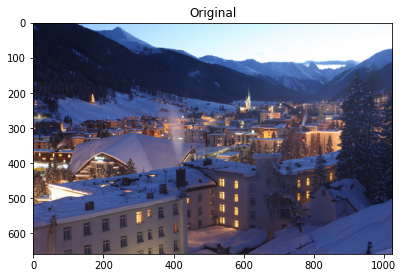

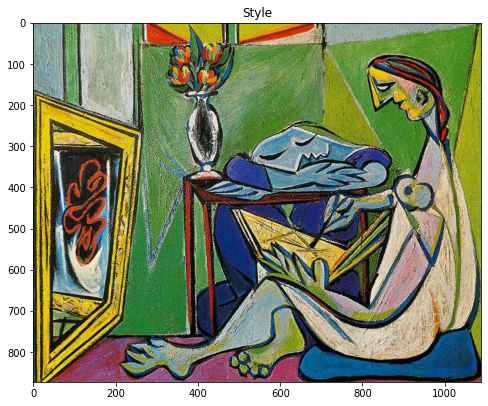

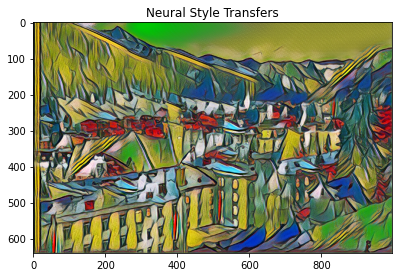

2. Using Model: composition_vii


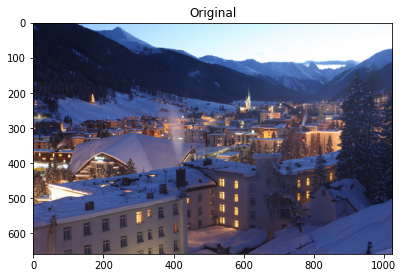

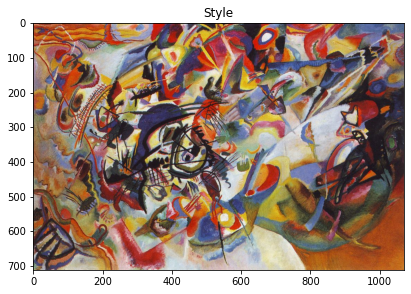

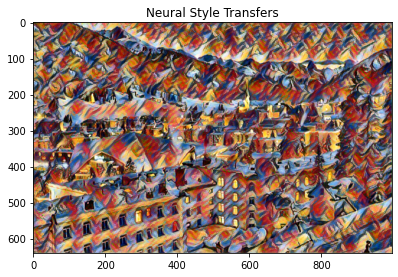

3. Using Model: starry_night


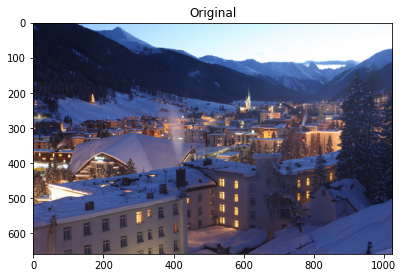

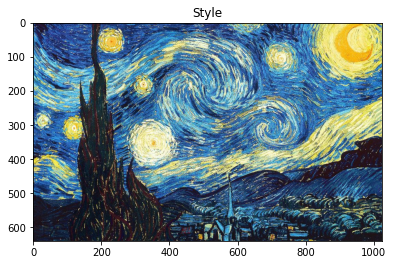

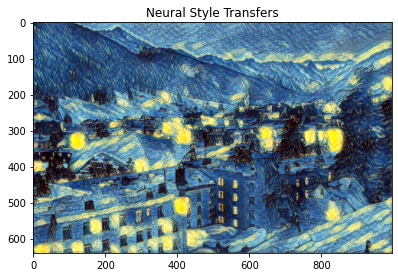

4. Using Model: the_wave


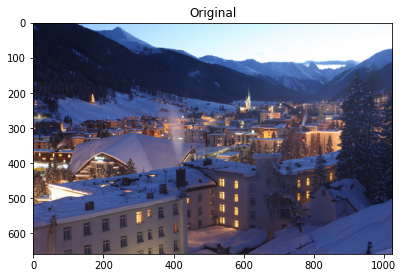

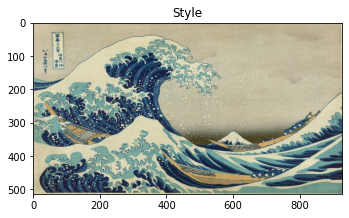

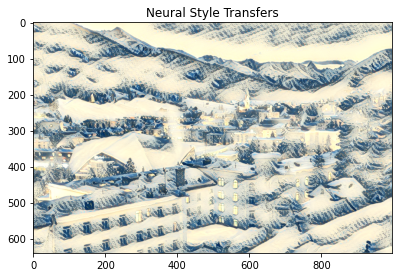

In [6]:
# Load our t7 neural transfer models
model_file_path = "NeuralStyleTransfer/models/ECCV16/"
model_file_paths = [f for f in listdir(model_file_path) if isfile(join(model_file_path, f))]

# Load our test image
img = cv2.imread("city.jpg")

# Loop through and applying each model style our input image
for (i,model) in enumerate(model_file_paths):
    # print the model being used
    print(str(i+1) + ". Using Model: " + str(model)[:-3])    
    style = cv2.imread("NeuralStyleTransfer/art/"+str(model)[:-3]+".jpg")
    # loading our neural style transfer model 
    neuralStyleModel = cv2.dnn.readNetFromTorch(model_file_path+ model)

    # Let's resize to a fixed height of 640 (feel free to change)
    height, width = int(img.shape[0]), int(img.shape[1])
    newWidth = int((640 / height) * width)
    resizedImg = cv2.resize(img, (newWidth, 640), interpolation = cv2.INTER_AREA)

    # Create our blob from the image and then perform a forward pass run of the network
    inpBlob = cv2.dnn.blobFromImage(resizedImg, 1.0, (newWidth, 640), (103.939, 116.779, 123.68), swapRB=False, crop=False)

    neuralStyleModel.setInput(inpBlob)
    output = neuralStyleModel.forward()

    # Reshaping the output tensor, adding back  the mean subtraction and re-ordering the channels 
    output = output.reshape(3, output.shape[2], output.shape[3])
    output[0] += 103.939
    output[1] += 116.779
    output[2] += 123.68
    output /= 255
    output = output.transpose(1, 2, 0)
    
    #Display our original image, the style being applied and the final Neural Style Transfer
    imshow("Original", img)
    imshow("Style", style)
    imshow("Neural Style Transfers", output)